## Construction Years Analysis

In this notebook, I thought it would be fun to try to visualize which sections of towns are the oldest, and which were constructed more recently.  It's also an exercise in generating and displaying raster (grid) data from vector data.

The assessor's database, which is contained in the residential tax parcels file, contains a construction yaer field.  Our goal is to generate a heatmap visualization showing the average year of construction in the neighborhood of a given map point.

We'll approach this as follows:

1. Create a bounding box for Milton
2. Generate a regular grid of points filling the Milton bounding box on which to calculate the for construction year heatmap
3. For each point, calculate average construction date of N nearest neighbor properties, and add to image.  If no properties within x meters, black.
4. Display construction year heatmap

In [1]:
import geopandas as gpd
import numpy as np
import folium
import joblib
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display
from shapely.geometry import Point


import milton_maps as mm

sns.set_style("darkgrid", {"axes.facecolor": ".9"})
sns.set(rc = {'figure.figsize':(15,8)})
sns.set_context("notebook")

/Users/alexhasha/Library/Caches/pypoetry/virtualenvs/milton-maps-gfMaDXEA-py3.10/lib/python3.10/site-packages/geopandas/_compat.py:123: UserWarning: The Shapely GEOS version (3.10.3-CAPI-1.16.1) is incompatible with the GEOS version PyGEOS was compiled with (3.10.4-CAPI-1.16.2). Conversions between both will be slow.
  warnings.warn(


In [2]:
town_boundaries = gpd.read_file("../data/processed/town_boundaries.shp.zip").set_index("TOWN_ID")
milton_quincy_boundaries = town_boundaries[town_boundaries.TOWN.isin(["MILTON", "QUINCY"])]
milton_quincy_boundaries.shape

(2, 19)

In [3]:
residential_tax_parcels = joblib.load("../data/processed/residential_tax_parcels.pkl")
residential_tax_parcels.shape

(32387, 28)

In [4]:
town_boundaries.crs

<Projected CRS: EPSG:26986>
Name: NAD83 / Massachusetts Mainland
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: United States (USA) - Massachusetts onshore - counties of Barnstable; Berkshire; Bristol; Essex; Franklin; Hampden; Hampshire; Middlesex; Norfolk; Plymouth; Suffolk; Worcester.
- bounds: (-73.5, 41.46, -69.86, 42.89)
Coordinate Operation:
- name: SPCS83 Massachusetts Mainland zone (meters)
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

Calculate the Milton bounding box.

In [5]:
(xmin, ymin, xmax, ymax) = town_boundaries.loc[189].geometry.bounds

These coordinates are in the "EPSG:26986" coordinate reference system, which is a cartesian projection measured in meters.
The absolute values can safely be ignored, but we need to convert to latitude and longitude when we want to display on a folium map.

In [6]:
(xmin, ymin, xmax, ymax)

(230482.1424999982, 883438.2446000017, 238662.33250000328, 892056.4745999984)

Generate a regular x,y grid with points spaced 50 meters apart within the Milton bounding box,
and reshape to a list of shapely `Point` objects.

In [7]:
# Generate grid and point list
xticks = np.arange(xmin, xmax, 50.0)
yticks = np.arange(ymin, ymax, 50.0)
X, Y = np.meshgrid(xticks, yticks, indexing='xy')

x = X.ravel()
y = Y.ravel()
p = [Point(xx, yy) for xx,yy in zip(x,y)]

In [8]:
milton_grid = gpd.GeoDataFrame(data={'x': x, 'y': y}, geometry=p, crs="EPSG:26986")
milton_grid.head()

,x,y,geometry
0,230482.1425,883438.2446,POINT (230482.142 883438.245)
1,230532.1425,883438.2446,POINT (230532.142 883438.245)
2,230582.1425,883438.2446,POINT (230582.142 883438.245)
3,230632.1425,883438.2446,POINT (230632.142 883438.245)
4,230682.1425,883438.2446,POINT (230682.142 883438.245)


For each point in the grid, we want to identify the $k$-nearest neighbor tax parcels within a specified radius
and calculate the average construction year of those neighboring parcels.

We start by generating a 150 meter buffer circle around each point in the grid:

<Axes: >

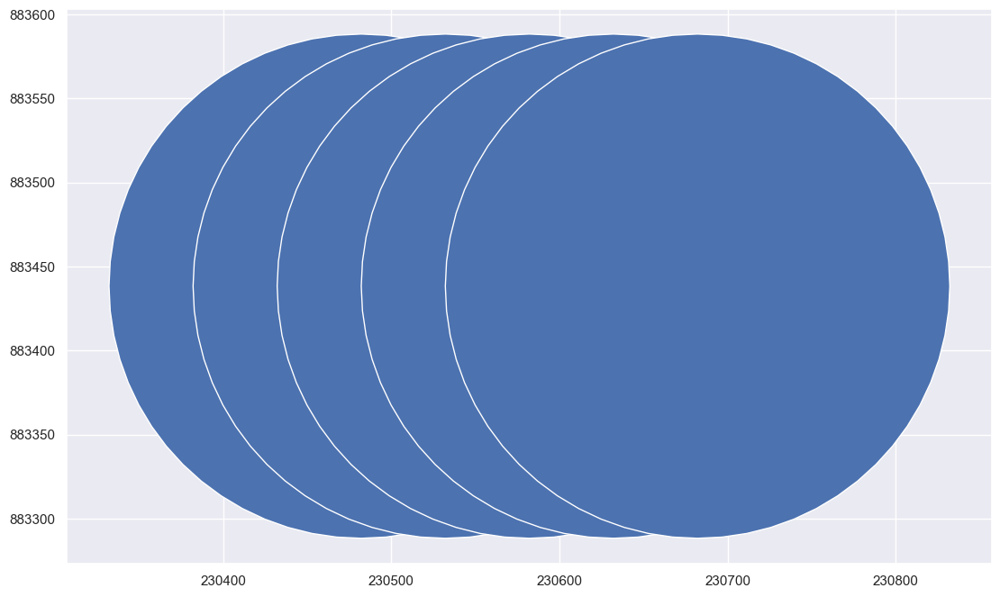

In [9]:
# Generate a buffer circle of radius 150 meters for each grid point.
milton_grid_buffered = milton_grid.copy()
milton_grid_buffered['geometry'] = milton_grid_buffered.geometry.buffer(150)
milton_grid_buffered.head().plot()

And convert the residential tax parcels dataframe geometries from boundary polygons to their centroids:

In [10]:
residential_parcel_centers = residential_tax_parcels.copy()
residential_parcel_centers['geometry'] = residential_parcel_centers['geometry'].centroid

Now, perform a spatial join between the grid buffer circles and tax parcel centroids, finding all tax parcels within the 150 meter buffer radius of each grid point:

In [11]:
grid_neighbors = residential_parcel_centers.sjoin(milton_grid_buffered, predicate="within")
grid_neighbors.shape

(302948, 31)

For each grid point / tax parcel pair, calculate the distance from the grid point to the tax parcel centroid

In [12]:
def grid_distance(row):
    dist = row['geometry'].distance(Point(row['x'], row['y']))
    return dist

grid_neighbors['neighbor_dist'] = grid_neighbors.apply(grid_distance, axis=1)

In [13]:
grid_neighbors.head()

,SHAPE_Leng,SHAPE_Area,MAP_PAR_ID,POLY_TYPE,MAP_NO,SOURCE,PLAN_ID,LAST_EDIT,BND_CHK,NO_MATCH,...,STYLE,LOT_SIZE,TOTAL_VAL,LAND_VAL,SITE_ADDR,IS_RESIDENTIAL,index_right,x,y,neighbor_dist
LOC_ID,,,,,,,,,,,,,,,,,,,,,
F_757603_2907021,718.018773,21213.803766,A 10 1B,FEE,A,ASSESS,A-9-10,20180101.0,NaN,N,...,CONTEMPORY,2.19,1459500.0,656200.0,1259 BRUSH HILL RD,True,8208,230882.1425,885938.2446,128.588769
F_757603_2907021,718.018773,21213.803766,A 10 1B,FEE,A,ASSESS,A-9-10,20180101.0,NaN,N,...,CONTEMPORY,2.19,1459500.0,656200.0,1259 BRUSH HILL RD,True,8209,230932.1425,885938.2446,124.374803
F_757603_2907021,718.018773,21213.803766,A 10 1B,FEE,A,ASSESS,A-9-10,20180101.0,NaN,N,...,CONTEMPORY,2.19,1459500.0,656200.0,1259 BRUSH HILL RD,True,8210,230982.1425,885938.2446,139.295053
F_758074_2906873,816.535998,27069.928790,A 10 12,FEE,A,OTHER,A-9-10,20120120.0,NaN,N,...,COLONIAL,6.54,2079700.0,754100.0,1425 BRUSH HILL RD,True,8210,230982.1425,885938.2446,111.604083
F_758204_2906549,641.513221,21533.836193,A 10 7,FEE,A,OTHER,A-9-10,20120120.0,NaN,N,...,COLONIAL,5.21,2664100.0,739900.0,1451 BRUSH HILL RD,True,8210,230982.1425,885938.2446,120.765580


In [14]:
gn = grid_neighbors.groupby(["x", "y"]).neighbor_dist.count()
gn.head()

x            y          
230782.1425  886038.2446    1
             886088.2446    1
230832.1425  885988.2446    1
             886038.2446    1
             886088.2446    1
Name: neighbor_dist, dtype: int64

Now, we implement the "k-nearest neighbor" average by grouping the data on grid points (x,y), sorting by increasing distance, and truncating after up to $k$ neighbors.  We'll use $k=5$ for the calculation.

In [15]:
def knearest_avg(df, k, field):
    knearest_avg = df.sort_values(by="neighbor_dist", ascending=True).iloc[:k][field].mean()
    return knearest_avg

avg_year_built = grid_neighbors.groupby(["x", "y"]).apply(lambda g: knearest_avg(g, 5, "YEAR_BUILT")).reset_index()
avg_year_built.head()

,x,y,0
0,230782.1425,886038.2446,1983.0
1,230782.1425,886088.2446,1983.0
2,230832.1425,885988.2446,1983.0
3,230832.1425,886038.2446,1983.0
4,230832.1425,886088.2446,1983.0


In [16]:
avg_year_built.shape

(10746, 3)

Construct a GeoDataFrame from the results:

In [17]:
geom = avg_year_built.apply(lambda row: Point(row.x, row.y), axis=1)
avg_year_built_df = gpd.GeoDataFrame(data={"x": avg_year_built.x,
                                           "y": avg_year_built.y,
                                           "avg_year": avg_year_built[0]},
                                     geometry=geom,
                                     crs="EPSG:26986",
)

/Users/alexhasha/Library/Caches/pypoetry/virtualenvs/milton-maps-gfMaDXEA-py3.10/lib/python3.10/site-packages/pandas/core/dtypes/cast.py:130: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


In [18]:
df_crs = avg_year_built_df.crs.to_string()

In [19]:
fig, ax = plt.subplots(1, figsize=(20,20))
ax = mm.plot_map(avg_year_built_df,
            column="avg_year",
            categorical=False,
            markersize=30,
            cmap='gnuplot',
            alpha=0.5,
            ax=ax
)
import contextily as ctx
ctx.add_basemap(ax, crs=df_crs)

We can see pockets of very old construction from the 19th century in the following areas:

* Along Hillside Street
* In East Milton Square around Adams Street
* In Lower Mills near the Baker Chocolate Factory
* Along Canton Avenue near Rt 138.

In [20]:
map_center = town_boundaries.to_crs("EPSG:4326").loc[189].geometry.centroid

Here it is again as an interactive map:

In [21]:
import branca.colormap as cm
colormap = cm.LinearColormap(colors=['red', 'blue', 'white'], index=[1765, 1900, 2021],vmin=1765,vmax=2021)

In [22]:
map_center = town_boundaries.to_crs("EPSG:4326").loc[189].geometry.centroid
milton_map = folium.Map(width=800,height=800, location=[map_center.y, map_center.x], zoom_start=13)
folium.GeoJson(milton_quincy_boundaries.to_crs("EPSG:3857").loc[[189]].geometry).add_to(milton_map)
for i, row in avg_year_built_df.fillna(0).to_crs("EPSG:4326").iterrows():
    folium.CircleMarker(
        (row.geometry.y, row.geometry.x),
        radius=1,
        color=colormap(row['avg_year'])
    ).add_to(milton_map)
folium.CircleMarker((map_center.y, map_center.x), radius=1, color="yellow").add_to(milton_map)
display(milton_map)